In [25]:
import numpy as np, matplotlib.pyplot as plt
from numpy import *
import pylab
import scipy as scipy
from scipy.io import wavfile
from numpy.fft import *
import scipy.signal as signal
from matplotlib.pyplot import *
import IPython
import cmath

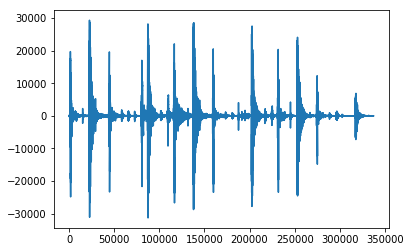

In [35]:
samplerate, sound = wavfile.read('loop3.wav')
IPython.display.display(IPython.display.Audio(sound, rate=samplerate))
plt.plot(sound)

# Part 1

# Sole echo Modeling

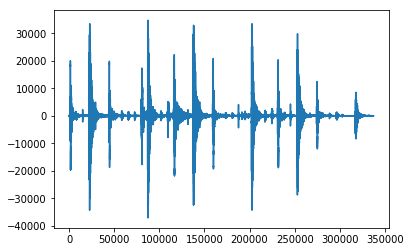

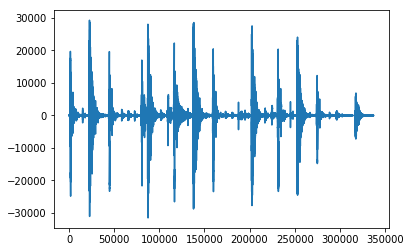

array([ 94. ,  59. ,   2. , ...,  -5.2,   0.5,  -0.6])

In [37]:
#Case 1 [0.1, 1]
def single_echo(N, g, sound):
    processed = np.append(np.zeros(N), sound)
    processed = processed[:-N]
    output_sound = np.zeros(sound.shape)
    output_sound = sound + np.multiply(g, processed)
    IPython.display.display(IPython.display.Audio(output_sound, rate=samplerate))
    plt.plot(output_sound)
    plt.show()
    return output_sound
    
#Case 1 [0.1, 1]    
N = 279
g = 0.3
single_echo(N, g, sound)

#Case 2 [1, 10]
N = 2786
g = 0.3
single_echo(N, g, sound)

# Comb Filter (Infinite Echo)

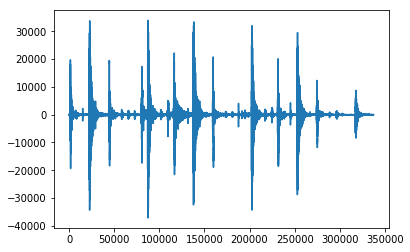

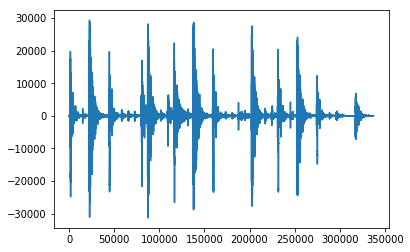

In [38]:
def comb_filter(N, g, sound):
    output_sound = np.zeros(sound.shape)
    for i in range(len(sound)):
        if(i<N):
            output_sound[i] = sound[i]
        else:
            output_sound[i] = sound[i] + np.multiply(g, output_sound[i-N])
        
    IPython.display.display(IPython.display.Audio(output_sound, rate=samplerate))
    plt.plot(output_sound)
    plt.show()
    return output_sound

#Case 1 [0.1, 1]
N = 279
g = 0.3 #Attenuation factor
c_sound = comb_filter(N, g, sound)

#Case 2 [1, 10]
N = 2786
g = 0.3 #Attenuation factor
c_sound = comb_filter(N, g, sound)

# All pass filter

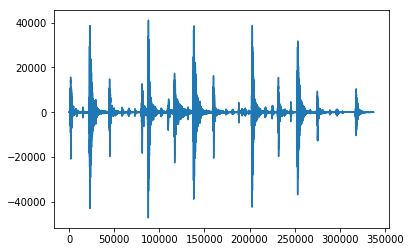

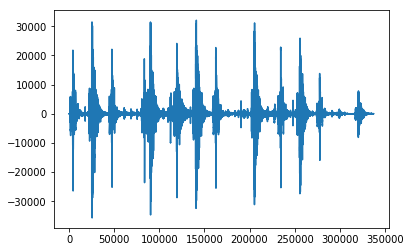

In [39]:
def allpass_filter(N, g, sound):
    processed = np.append(np.zeros(N), sound)
    processed = processed[:-N]
    output_sound = np.zeros(sound.shape)
    output_sound = np.multiply(sound, g) + processed

    for i in range(len(sound)):
        if(i<N):
            continue
        else:
            output_sound[i] = output_sound[i] + np.multiply(g, output_sound[i-N])

    IPython.display.display(IPython.display.Audio(output_sound, rate=samplerate))
    plt.plot(output_sound)
    plt.show()
    return output_sound

#Case 1 [0.1, 1]
N = 279
g = 0.3 #Attenuation factor
c_sound = allpass_filter(N, g, sound)

#Case 2 [1, 10]
N = 2786
g = 0.3 #Attenuation factor
c_sound = allpass_filter(N, g, sound)

# Part 2

In [40]:
def calc_N(samplerate, i):
    return int(samplerate/10*(3**(i)))

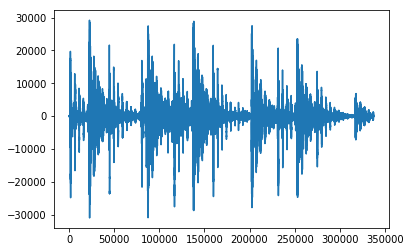

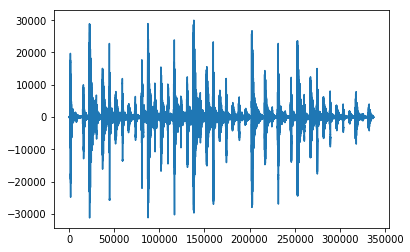

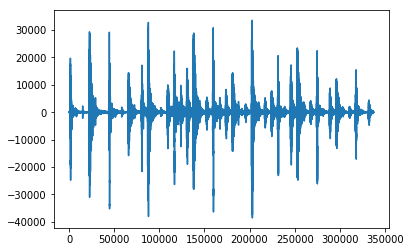

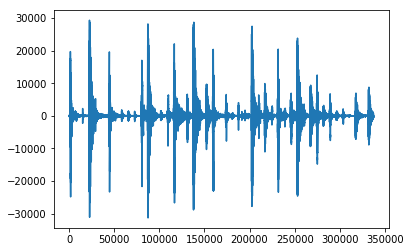

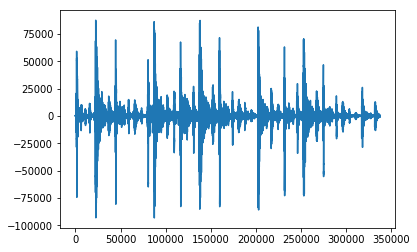

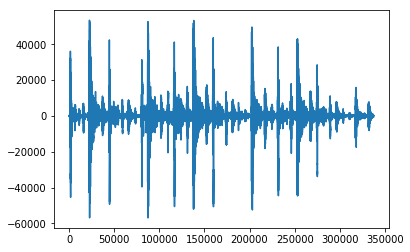

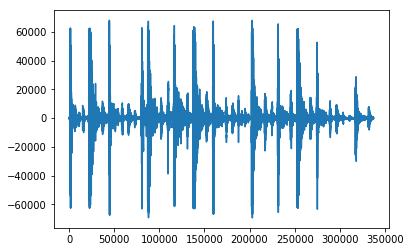

In [48]:
combs = []
gs = [0.65, 0.51, 0.5, 0.32]

#Parallel Comb filters
for i in range(4):
    N = calc_N(samplerate, i)
    combs.append(comb_filter(N, gs[i], sound))

combs_output = combs[0] + combs[1] + combs[2] + combs[3]

# Serial Allpass filters
N = calc_N(samplerate, 5)
allpass1 = allpass_filter(N, 0.75, combs_output)
N = calc_N(samplerate, 6)
allpass2 = allpass_filter(N, 0.61, allpass1)

#Adding dryness to final sound
final_sound = allpass2 + (sound*2)
IPython.display.display(IPython.display.Audio(final_sound, rate=samplerate))
plt.plot(final_sound)
plt.show()

#Refer to last sound and plot below for final output

# Part 3 Room response

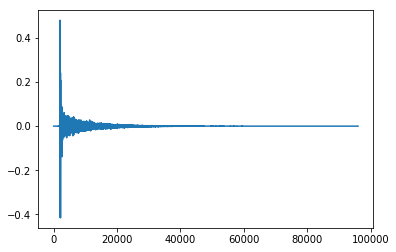

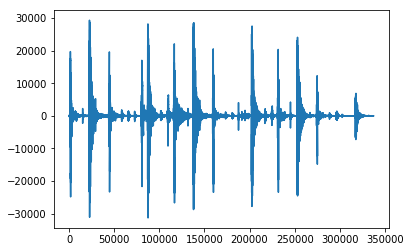

In [42]:
samplerate_room, room_resp = wavfile.read('andrew.wav')
room_resp = room_resp.T
IPython.display.display(IPython.display.Audio(room_resp, rate=samplerate_room))
plt.plot(room_resp[0])
plt.show()

samplerate, sound = wavfile.read('loop3_up.wav') #Upsampled given drum sound
IPython.display.display(IPython.display.Audio(sound, rate=samplerate_room))
plt.plot(sound)
plt.show()

# Time Domain

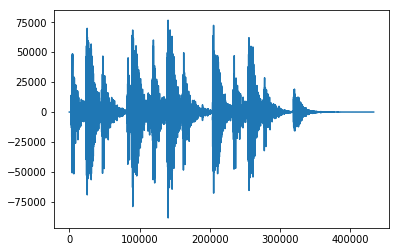

In [49]:
freq_convolve = signal.convolve(room_resp[0], sound)
freq_convolve1 = signal.convolve(room_resp[1], sound)

final_sound = np.array([freq_convolve, freq_convolve1])
final_sound = final_sound.T
IPython.display.display(IPython.display.Audio(freq_convolve, rate=samplerate))

plt.plot(freq_convolve)
plt.show()

# Frequency Domain

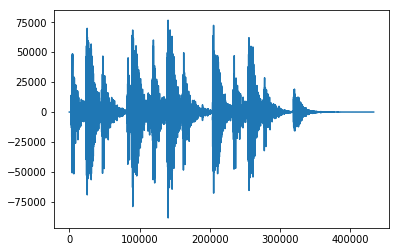

In [50]:
freq_convolve = signal.fftconvolve(room_resp[0], sound)
freq_convolve1 = signal.fftconvolve(room_resp[1], sound)

final_sound = np.array([freq_convolve, freq_convolve1])
final_sound = final_sound.T
IPython.display.display(IPython.display.Audio(freq_convolve, rate=samplerate))

plt.plot(freq_convolve)
plt.show()